In [2]:
# pip install bokeh

<h1> <center> CS5052 P1: MovieLens Analysis Using PySpark </center> </h1>

<h2> <center> STUDENT ID: 210015564 </center> </h2>

<h3> <center> Frame the Problem </center> </h3>

> The movielens dataset from movielens.org contains 27,753,444 ratings and 1,108,997 tag applications across 58,098 movies. These data were created by 283,228 users between January 09, 1995 and September 26, 2018. Our objective is to use PySpark, the Python API for Apache Spark, to conduct an analysis of the dataset, allow for user input to interact with the data, and use a recommendation engine to provide user and content-based recommendations.

<h3> <center> Import Libraries and Packages </center> </h3>

In [3]:
import pyspark
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import nltk
import findspark
import ipywidgets as widgets

from pyspark import SparkConf, SparkContext
from pyspark.sql import SparkSession
from IPython.display import display
from pyspark.sql.types import *
from pyspark.sql.functions import *
from pyspark.sql import functions as F
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from fuzzywuzzy import fuzz
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


<h3><center> Set Spark Configuration </center> </h3>

In [4]:
conf=SparkConf()
conf.set("spark.executor.memory", "7g")
conf.set("spark.driver.memory", "7g")
conf.set("spark.cores.max", "6")
findspark.init()
spark = SparkSession.builder.config(conf=conf).getOrCreate()

22/04/22 16:24:33 WARN Utils: Your hostname, Mehers-MacBook-Pro.local resolves to a loopback address: 127.0.0.1; using 138.251.176.82 instead (on interface en0)
22/04/22 16:24:33 WARN Utils: Set SPARK_LOCAL_IP if you need to bind to another address
Using Spark's default log4j profile: org/apache/spark/log4j-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
22/04/22 16:24:34 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [5]:
from IPython.display import HTML
HTML('''<script>
code_show_err=false; 
function code_toggle_err() {
 if (code_show_err){
 $('div.output_stderr').hide();
 } else {
 $('div.output_stderr').show();
 }
 code_show_err = !code_show_err
} 
$( document ).ready(code_toggle_err);
</script>
To toggle on/off output_stderr, click <a href="javascript:code_toggle_err()">here</a>.''')

<h3> <center> Read and Store the Dataset into a DataFrame </center> </h3>

In [8]:
schema = (StructType().add)("movieId", IntegerType()).add("title", StringType()).add("genres", StringType())
moviesdf = spark.read.csv("file:/Users/mehervaswani/Desktop/CS5052/ml-latest-small/movies.csv", schema=schema, header=True)

schema = (StructType().add)("userId", IntegerType()).add("movieId", IntegerType()).add("rating", FloatType()).add("timestamp", IntegerType())
ratingsdf = spark.read.csv("file:/Users/mehervaswani/Desktop/CS5052/ml-latest-small/ratings.csv", schema=schema, header=True)

# schema = (StructType().add)("userId", IntegerType()).add("movieId", IntegerType()).add("tag", StringType()).add("timestamp", IntegerType())
# tagsdf = spark.read.csv("file:/Users/mehervaswani/Desktop/CS5052/ml-latest/tags.csv", schema=schema, header=True)

# schema = (StructType().add)("tagId", IntegerType()).add("tag", StringType())
# gtagsdf = spark.read.csv("file:/Users/mehervaswani/Desktop/CS5052/ml-latest/genome-tags.csv", schema=schema, header=True)

# schema = (StructType().add)("movieId", IntegerType()).add("tagId", IntegerType()).add("genres", FloatType())
# scoresdf = spark.read.csv("file:/Users/mehervaswani/Desktop/CS5052/ml-latest/genome-scores.csv", schema=schema, header=True)

In [9]:
movieratingsdf = moviesdf.join(ratingsdf, moviesdf.movieId==ratingsdf.movieId).drop(ratingsdf.movieId).drop(ratingsdf.timestamp)

<h3> <center> Explore the Data </center> </h3>

<h4> Movies By Genre </h4>

> While there are only 50K movies in the dataset, each movie can be categorised by multiple genres. The most watched movies in the dataset fall largely within the genre of Drama, Comedy, and Action.

In [10]:
genredf = movieratingsdf.withColumn("genres", explode(split("genres", "[|]")))
userGenre = genredf.groupBy('genres').count()
userGenre = userGenre.toPandas()

In [11]:
fig = px.pie(values=userGenre['count'], names=userGenre['genres'])
fig.show()

> Details of the movies within each genre can be searched by selecting a specific genre. Searching by the genre of Drama, below are a list of movies which have received a 5.0 rating by any single user. most number of titles.

In [9]:
genreSelection = widgets.Dropdown(options=['Thriller', 'Action', 'Adventure', 'Crime', 'Comedy', 'Horror', 'Film-Noir', 'Animation', '(no genres listed)', 'Mystery', 'Documentary', 'Western', 'War', 'Fantasy', 'IMAX', 'Drama', 'Children', 'Romance', 'Musical', 'Sci-Fi'], description="Genre")
genreSelection

Dropdown(description='Genre', options=('Thriller', 'Action', 'Adventure', 'Crime', 'Comedy', 'Horror', 'Film-N…

In [10]:
movieGen = genredf.drop(genredf.userId)
movieGen.filter(movieGen.genres == genreSelection.value).sort("rating", ascending=False).show(10, truncate = False)

+-------+----------------------------------------------+--------+------+
|movieId|title                                         |genres  |rating|
+-------+----------------------------------------------+--------+------+
|5418   |Bourne Identity, The (2002)                   |Thriller|5.0   |
|86644  |Fast Five (Fast and the Furious 5, The) (2011)|Thriller|5.0   |
|805    |Time to Kill, A (1996)                        |Thriller|5.0   |
|77561  |Iron Man 2 (2010)                             |Thriller|5.0   |
|1252   |Chinatown (1974)                              |Thriller|5.0   |
|2403   |First Blood (Rambo: First Blood) (1982)       |Thriller|5.0   |
|1356   |Star Trek: First Contact (1996)               |Thriller|5.0   |
|50     |Usual Suspects, The (1995)                    |Thriller|5.0   |
|1876   |Deep Impact (1998)                            |Thriller|5.0   |
|4226   |Memento (2000)                                |Thriller|5.0   |
+-------+------------------------------------------

<h4> Movies Watched By Movie Release Year </h4>

> Users vary in their preference of older, period movies or modern, contemporary movies. We can see that movies released in the year 1995 were the most watched. 

In [11]:
moviesByYeardf = moviesdf.select('movieId','title',regexp_extract('title',r'\((\d+)\)',1).alias('year').cast(IntegerType()))

In [12]:
byYear = moviesByYeardf.join(movieratingsdf, moviesByYeardf.movieId==movieratingsdf.movieId).drop(movieratingsdf.genres).drop(movieratingsdf.movieId).drop(movieratingsdf.title).drop(movieratingsdf.genres).drop(movieratingsdf.rating).drop(movieratingsdf.genres)
byYear = byYear.groupBy('year').agg(F.count(byYear.userId).alias("WatchedBy")).sort("year", ascending=True)
byYear = byYear.toPandas()

In [138]:
byYear["year"]=byYear["year"].apply(str)
fig = px.bar(byYear, x=byYear['year'], y=byYear['WatchedBy'],
             hover_data=['year', 'WatchedBy'], color='WatchedBy',
             labels={'year'}, height=400)
fig.show()

In [14]:
YearSelection = widgets.Dropdown(options=[1874, 1878, 1883, 1887, 1888, 1890, 1891, 1892, 1893, 1894, 1895, 1896, 1897, 1898, 1899, 1900, 1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1909, 1910, 1911, 1912, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018], description="Year")
YearSelection

Dropdown(description='Year', options=(6, 69, 500, 1874, 1878, 1883, 1887, 1888, 1890, 1891, 1892, 1893, 1894, …

In [139]:
moviesByYear = moviesByYeardf.filter(moviesByYeardf.year == YearSelection.value).count()
print('The year ' + str(YearSelection.value) + ' has ' + str(moviesByYear) + ' movie(s). The details are as follows: ')
yeardf = moviesByYeardf.filter(moviesByYeardf.year == YearSelection.value).drop(moviesByYeardf.movieId).drop(moviesByYeardf.year)
yeardf.show(10, truncate=False)

The year 1995 has 697 movie(s). The details are as follows: 
+----------------------------------+
|title                             |
+----------------------------------+
|Toy Story (1995)                  |
|Jumanji (1995)                    |
|Grumpier Old Men (1995)           |
|Waiting to Exhale (1995)          |
|Father of the Bride Part II (1995)|
|Heat (1995)                       |
|Sabrina (1995)                    |
|Tom and Huck (1995)               |
|Sudden Death (1995)               |
|GoldenEye (1995)                  |
+----------------------------------+
only showing top 10 rows



<h4> By Ratings </h4>

> Movies can be categorised by their ratings. Since not all movies have received ratings, or received ratings by only a handful of users, a more representative measure of their popularity is to measure them by their average rating by total number of users. The data indicates that Shawshank Redemption and Forrest Gump are the highest rated and most watched movies of all time.

In [16]:
top = movieratingsdf.groupBy('title').agg(F.count(movieratingsdf.userId).alias("users"), F.avg(movieratingsdf.rating).alias("average")).sort(desc("users"), desc("average"))

In [17]:
top = top.toPandas()

In [18]:
fig = px.scatter(top, x=top['average'], y=top['users'], color="users", hover_name="title",size="average")
fig.show()

<h4> Highest or Least Rated Movies </h4>

In [19]:
ratings = widgets.Dropdown(
    options=["Top Rated Movies", "Poorly Rated Movies"], description="Ratings"
)
ratings

Dropdown(description='Ratings', options=('Top Rated Movies', 'Poorly Rated Movies'), value='Top Rated Movies')

In [20]:
if ratings.value == "Top Rated Movies":
    movieratingsdf.groupBy('title').agg(F.count(movieratingsdf.userId).alias("users"), F.avg(movieratingsdf.rating).alias("average")).sort(desc("users"), desc("average")).show(10, truncate=False)
else:
    movieratingsdf.groupBy('title').agg(F.count(movieratingsdf.userId).alias("Users"), F.avg(movieratingsdf.rating).alias("average")).sort(asc("users"), asc("average")).show(10, truncate=False)

+-----------------------------------------+-----+------------------+
|title                                    |users|average           |
+-----------------------------------------+-----+------------------+
|Shawshank Redemption, The (1994)         |97999|4.424188001918387 |
|Forrest Gump (1994)                      |97040|4.056584913437757 |
|Pulp Fiction (1994)                      |92406|4.173971387139363 |
|Silence of the Lambs, The (1991)         |87899|4.15141241652351  |
|Matrix, The (1999)                       |84545|4.149695428470046 |
|Star Wars: Episode IV - A New Hope (1977)|81815|4.120454684348836 |
|Jurassic Park (1993)                     |76451|3.6650338125073576|
|Schindler's List (1993)                  |71516|4.257501817775044 |
|Braveheart (1995)                        |68803|4.008480734851678 |
|Toy Story (1995)                         |68469|3.8866494325899312|
+-----------------------------------------+-----+------------------+
only showing top 10 rows



<h4> By Unique Watches </h4>

> We can isolate the popularity of a movie by investigating only the number of unique users who have watched a given movie. The data indicates that Shawshank Redemption, Forrest Gump, and Pulp Fiction are the top 3 most watched movies of all time. Interestingly, IMDB seems to concur with the list as per their top 250 movies list. 

In [21]:
topWatch = movieratingsdf.groupBy('title').agg(F.count(movieratingsdf.userId).alias("count")).sort(desc("count"))

In [22]:
topWatch = topWatch.toPandas()
topWatch = topWatch.head(20)

In [23]:
fig = px.histogram(topWatch, x=topWatch['title'], y=topWatch['count'], color="count", hover_name="title")
fig.update_xaxes(visible=False, showticklabels=False)
fig.show()

<h4> Most or Least Watched Movies </h4>

In [24]:
watches = widgets.Dropdown(options=["Most Watched Movies", "Least Watched Movies"], description="Watches")
watches

Dropdown(description='Watches', options=('Most Watched Movies', 'Least Watched Movies'), value='Most Watched M…

In [25]:
if watches.value == "Most Watched Movies":
    movieratingsdf.groupBy('title').agg(F.count(movieratingsdf.userId).alias("count")).sort(desc("count")).show(10, truncate=False)
else:
    movieratingsdf.groupBy('title').agg(F.count(movieratingsdf.userId).alias("count")).sort("count", ascending=True).show(10, truncate=False)

+-----------------------------------------+-----+
|title                                    |count|
+-----------------------------------------+-----+
|Shawshank Redemption, The (1994)         |97999|
|Forrest Gump (1994)                      |97040|
|Pulp Fiction (1994)                      |92406|
|Silence of the Lambs, The (1991)         |87899|
|Matrix, The (1999)                       |84545|
|Star Wars: Episode IV - A New Hope (1977)|81815|
|Jurassic Park (1993)                     |76451|
|Schindler's List (1993)                  |71516|
|Braveheart (1995)                        |68803|
|Toy Story (1995)                         |68469|
+-----------------------------------------+-----+
only showing top 10 rows



<h3> <center> Interact with the Data </center> </h3>

> We can deep dive into the dataset by exploring the details of a specific movie by movieID or by a user's preference using their userID. 

<h4> Search by Movie ID </h4>

> Searching for a movie by a randomly selected ID '123' displays Chungking Express released in 1994 has received 2.8K+ ratings with an average rating of 3.9. 

In [26]:
movieId=widgets.Text(
    placeholder='Enter Movie ID',
    description='ID:',
    disabled=False
)
movieId

Text(value='', description='ID:', placeholder='Enter Movie ID')

In [37]:
movieID = movieId.value
df = movieratingsdf.filter(movieratingsdf.movieId == movieID)
avg = df.groupBy('title').agg(F.count(df.userId).alias("Total Ratings"), F.avg(df.rating).alias("average")).show(truncate=False)

+---------------------------------------------+-------------+----------------+
|title                                        |Total Ratings|average         |
+---------------------------------------------+-------------+----------------+
|Chungking Express (Chung Hing sam lam) (1994)|2866         |3.98831123517097|
+---------------------------------------------+-------------+----------------+



<h4> Search by User ID </h4>

> Searching for a user by their User ID, we can see that User 27 has watched a total of 16 movies with Toy Story,  being their highest rated movies being Monty Python, Inside Out, and American Beauty. Their preferred genres are Drama, Comedy, and Adventure based on the number of movies they have watched that fall within that genre. 

In [28]:
userId=widgets.Text(
    placeholder='Enter User ID',
    description='User ID:',
    disabled=False
)
userId

Text(value='', description='User ID:', placeholder='Enter User ID')

In [38]:
userid = userId.value
count = movieratingsdf.filter(movieratingsdf.userId == userid).count()
print('User ' + userid + ' has watched a total of ' + str(count) + ' movies. The details are as follows: ')
userPref = movieratingsdf.filter(movieratingsdf.userId == userid).sort("rating", ascending=False).show(count)

User 27 has watched a total of 16 movies. The details are as follows: 


+-------+--------------------+--------------------+------+------+
|movieId|               title|              genres|userId|rating|
+-------+--------------------+--------------------+------+------+
|   1136|Monty Python and ...|Adventure|Comedy|...|    27|   5.0|
| 134853|   Inside Out (2015)|Adventure|Animati...|    27|   5.0|
|   2858|American Beauty (...|       Drama|Romance|    27|   5.0|
|      1|    Toy Story (1995)|Adventure|Animati...|    27|   5.0|
|  78499|  Toy Story 3 (2010)|Adventure|Animati...|    27|   5.0|
|    356| Forrest Gump (1994)|Comedy|Drama|Roma...|    27|   4.5|
|   2571|  Matrix, The (1999)|Action|Sci-Fi|Thr...|    27|   4.5|
|    318|Shawshank Redempt...|         Crime|Drama|    27|   4.5|
|   1270|Back to the Futur...|Adventure|Comedy|...|    27|   4.5|
|  58559|Dark Knight, The ...|Action|Crime|Dram...|    27|   4.5|
|  68954|           Up (2009)|Adventure|Animati...|    27|   4.5|
|     50|Usual Suspects, T...|Crime|Mystery|Thr...|    27|   4.5|
|    296| 

In [39]:
userPref = movieratingsdf.filter(movieratingsdf.userId == userid).sort("rating", ascending=False)
userPrefGenre = userPref.withColumn("genres", explode(split("genres", "[|]")))
userPrefGenre.groupBy('genres').count().sort("count", ascending=False).show(3)

+---------+-----+
|   genres|count|
+---------+-----+
|    Drama|    9|
|   Comedy|    7|
|Adventure|    6|
+---------+-----+
only showing top 3 rows



<h3> <center> Compare Two Users by Movie Preference </center> </h3>

> We can compare two users based on their preferences as determined by their favorite genres, whether they prefer older or newer movies, movie ratings, and keywords used. Here we compare User 27 with User 2.

In [31]:
a = widgets.Text(description="User ID 1")
b = widgets.Text(description="User ID 2")
widgets.VBox([a,b])

In [54]:
usrPref = moviesdf.join(ratingsdf, moviesdf.movieId==ratingsdf.movieId).drop(ratingsdf.movieId)

In [55]:
userTaste = usrPref.join(moviesByYeardf, usrPref.movieId==moviesByYeardf.movieId).drop(moviesByYeardf.movieId).drop(moviesByYeardf.title)
userTaste = userTaste.withColumn("genres", explode(split("genres", "[|]")))

In [56]:
filter_values_list = [a.value, b.value]
users = userTaste.filter(userTaste.userId.isin(filter_values_list))
users = users.toPandas()

In [74]:
woGenre = users.drop(columns=['genres'])
woGenre = woGenre.drop_duplicates()

<h4> By Genre </h4>

> User 27 watches movies across all genres with a particular affinity for Drama, Comedy and Adventure whereas User 2 avoids movies within Animation, Children, and Fantasy among others.

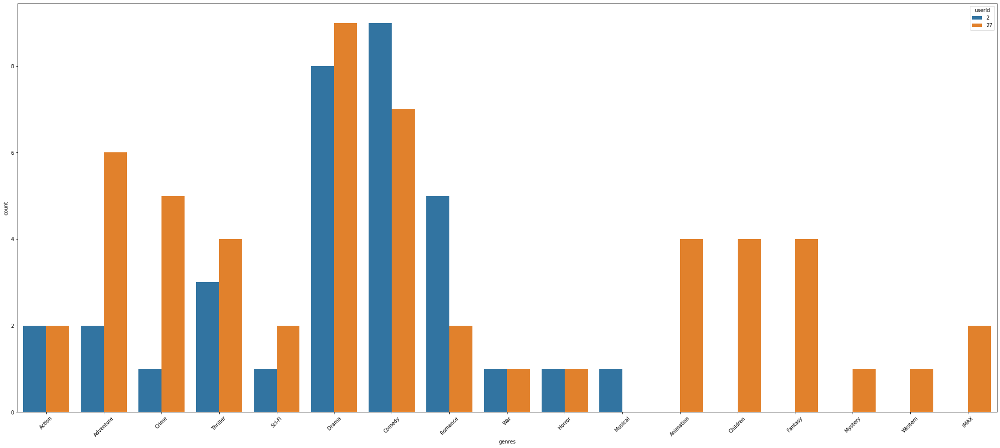

In [81]:
fig, ax = plt.subplots(figsize=(35,15))
one = sns.countplot(x=users['genres'], hue=users['userId'], data=users)
one.set_xticklabels(one.get_xticklabels(), rotation=45) 
plt.show()

<h4> By Movie Year </h4>

> User 27 prefers more recent movies from the early 2000s with some exception of movies from the late 1990s whereas User 2 prefers older movies from the 1970s to 1990s. 

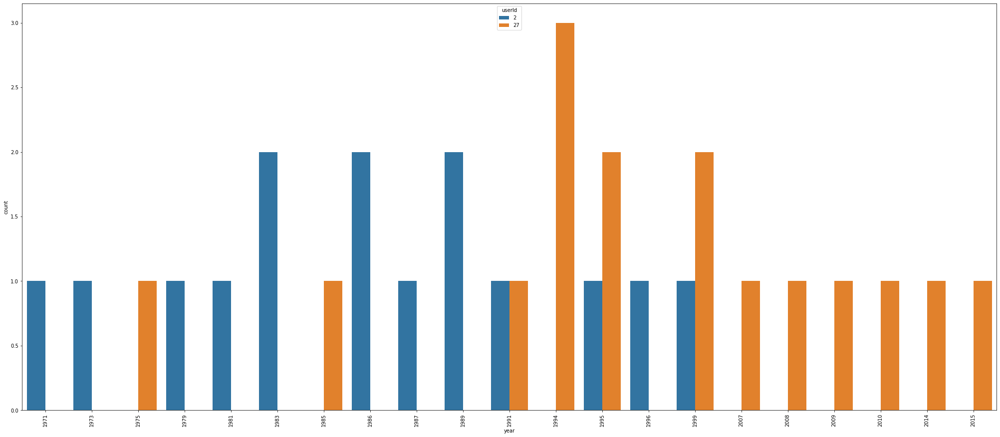

In [82]:
fig, ax = plt.subplots(figsize=(35,15))
two = sns.countplot(x=woGenre['year'], hue=woGenre['userId'], data=woGenre)
two.set_xticklabels(two.get_xticklabels(), rotation=90) 
None

<h4> By Ratings Given </h4>

> User 27 is more generous with their 4-5 star ratings whereas User 2 seems to be harder to please, having provided no 5 star ratings and mostly 3.5 star ratings.

<AxesSubplot:xlabel='rating', ylabel='count'>

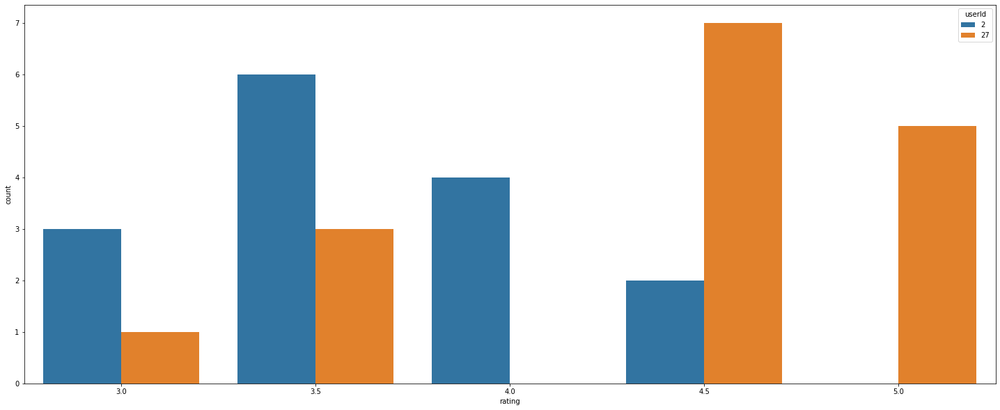

In [137]:
fig, axes = plt.subplots(figsize=(25,10), sharey=True)
sns.countplot(x=woGenre['rating'], hue=woGenre['userId'], data=woGenre)

<h4> By Time </h4>

In [71]:
import datetime
users['timestamp'] = pd.to_datetime(users['timestamp'], 
                                  unit='s')

> The timestamp column indicated the time at which the rating for a movie was given but it may not be indicative of when the movie was watched. From the data it seems that both User 2 and User 27 provided ratings for only some of the movies they watched in a single month (Oct and Aug, respectively) but almost 8 years apart. 

In [89]:
fig = px.line(users, x=users['timestamp'], y=users['title'], color=users['userId'])
fig.show()

<h4> By Descriptions Given </h4>

In [84]:
filter_values_list = [a.value, b.value]
tags = tagsdf.filter(tagsdf.userId.isin(filter_values_list))

In [85]:
tagspd = tagsdf.toPandas()

In [86]:
usr1 = pd.unique(tagspd['userId'])[0]
usr2 = pd.unique(tagspd['userId'])[1]

In [87]:
df1 = tagspd[tagspd['userId'] == usr1]
df2 = tagspd[tagspd['userId'] == usr2]

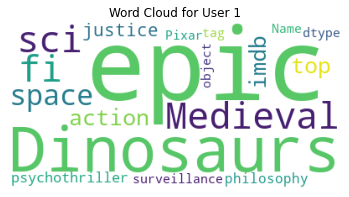

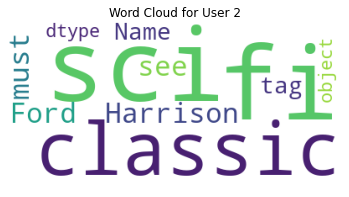

In [90]:
plt.figsize=(10,25)
stopwords = set(STOPWORDS)
wordcloud1 = WordCloud(
                      background_color = 'white',
                      stopwords=stopwords,
                      max_words = 1000,
                      max_font_size = 120,
                      random_state = 42,
                    ).generate(str(df1['tag']))
plt.imshow(wordcloud1)
plt.title("Word Cloud for User 1", fontsize = 12)
plt.axis('off')
plt.show()

wordcloud2 = WordCloud(
                      background_color = 'white',
                      stopwords=stopwords,
                      max_words = 1000,
                      max_font_size = 120,
                      random_state = 42,
                    ).generate(str(df2['tag']))

plt.imshow(wordcloud2)
plt.title("Word Cloud for User 2", fontsize = 12)
plt.axis('off')
plt.show()

> Our brief analysis of the movie preferences of two users allow us to create a vague profile of each user and who they may be. User 2 is likely of an older generation who prefers more serious, classical, period movies and may not have actively watched any more movies in recent years. User 27, on the other hand, is likely to be of a younger demographic. User 2 has watched 16 movies of varying moods released in recent years but skews towards movies that are lighthearted, engaging, and dynamic across themes of scifi and space, dinosaurs, and psychothrillers.

<h3> <center> Cluster Users by Movie Preference </center> </h3>

> We can cluster users from the entire dataset by their preferences as well. While this may increase the abstraction, we create an interactive scatter plot to group users based on the various important dimensions such as genre, movie release year, and movie rating. The plot indicates that there did not always exist such a large variety of genres in the past, especially in the 1800s and 1900s. There is almost a standstill in the movies produced (at least within the realm of the dataset) in the early 1900s. Horror sees a significant uptick in 1922 and so does SciFi and Drama movies not long after. Fantasy and Romance take the lead in the mid 1900s. Of recent years, however, most users are attracted by Action, SciFi, Comedy and Thrillers while niche genres such as Film Noir, Musicals, and Documentaries taking a back seat which makes sense because more movies within action, comedy, and thrillers have been released in recent years. 

In [91]:
upd = movieratingsdf.withColumn("genres", explode(split("genres", "[|]")))

In [92]:
upd = upd.join(moviesByYeardf, moviesByYeardf.movieId==upd.movieId).drop(moviesByYeardf.title).drop(moviesByYeardf.movieId)

In [93]:
upd = upd.groupBy('genres', 'year').agg(F.count(upd.userId).alias("users"), F.avg(upd.rating).alias("average")).sort(desc("year"))

In [94]:
userCluster = upd.toPandas()
userCluster = userCluster.fillna('Other')

In [96]:
fig = px.scatter(userCluster, x="genres", y="users", animation_frame="year", 
           size="average", color="genres", hover_name="average", size_max=22)
fig.show()

<h3> <center> Movie Recommendation Engine </center> </h3>

> For the purposes of creating a recommendation engine for our project, we will use the smaller dataset provided ('ml-latest-small') since using the larger dataset will be computationally expensive. We further divide the smaller dataset using sampling to speed up the computation time. This may introduce a slight variation in our analysis. 

> We also opt to use Python Pandas to read and store the data into a dataframe so that we can leverage Python's ML libraries such as TF-IDF and SKLearn. I opted to use Python's TF-IDF over PySpark's Hashing and CountVectorizer because it not only counts term frequency but also feature importance, which is important for our recommendation engine. My recommendation engine takes two inputs: one based on a User ID to determine movie preferences for the user based on their most watched genre and second based on a movie title to determine closely related movies. For the latter, I use cosine similarity to determine the relevance score of a title. 

In [97]:
movies = pd.read_csv("file:/Users/mehervaswani/Desktop/CS5052/ml-latest-small/movies.csv")
ratings = pd.read_csv("file:/Users/mehervaswani/Desktop/CS5052/ml-latest-small/ratings.csv")

In [99]:
df = movies.set_index('movieId').join(ratings.set_index('movieId')).drop(columns=['timestamp'])

In [100]:
df['genres'] = df['genres'].str.replace('Sci-Fi','SciFi')
df['genres'] = df['genres'].str.replace('Film-Noir','Noir')
df = df.sample(frac=0.2, replace=False, random_state=5564)
df = df[~(df['genres']=='(no genres listed)')].reset_index(drop=True)
tfidf_vector = TfidfVectorizer()
tfidf_matrix = tfidf_vector.fit_transform(df['genres'])

In [101]:
tfidf_matrix.shape

(20161, 19)

In [102]:
from sklearn.metrics.pairwise import linear_kernel
sim_matrix = linear_kernel(tfidf_matrix,tfidf_matrix) 

In [108]:
matrix = pd.DataFrame(tfidf_matrix.todense(), columns=tfidf_vector.get_feature_names_out(),   index=df['title'])

In [103]:
userid=widgets.Text(
    placeholder='Enter User ID',
    description='User ID:',
    disabled=False
)
userid

Text(value='', description='User ID:', placeholder='Enter User ID')

In [122]:
userId = int(userid.value)
filt = (df['userId'] == userId)
filtered = df[filt]
fav = (filtered.genres.str.split('|')
                    .explode()
                    .value_counts()
                    .sort_values(ascending=False)).idxmax()
for i in range(len(matrix.columns)):
    m = str(fav.lower())
    if (matrix.columns[i] == fav.lower()):
        new = matrix[m].sort_values(ascending=False).drop_duplicates(keep='first')
        print('Top 10 titles recommended for ' + str(userId) + ' are: ', new.head(10))

Top 10 titles recommended for 27 are:  title
White Water Summer (1987)                                                         1.000000
Walkabout (1971)                                                                  0.788777
Harold and Kumar Go to White Castle (2004)                                        0.779894
Raiders of the Lost Ark (Indiana Jones and the Raiders of the Lost Ark) (1981)    0.740304
Joy Ride (2001)                                                                   0.718983
Little Miss Sunshine (2006)                                                       0.666462
Paradise (1982)                                                                   0.664549
Land That Time Forgot, The (1975)                                                 0.660853
Into the Wild (2007)                                                              0.641246
Austin Powers: The Spy Who Shagged Me (1999)                                      0.636445
Name: adventure, dtype: float64


In [118]:
movieTitle=widgets.Text(
    placeholder='Enter Movie Title',
    description='Movie Title:',
    disabled=False
)
movieTitle

Text(value='', description='Movie Title:', placeholder='Enter Movie Title')

In [123]:
movieTitle.value

'fight club'

In [134]:
def matching_score(a,b):
   return fuzz.ratio(a,b)

def get_title_from_index(index):
   return df[df.index == index]['title'].values[0]

def get_index_from_title(title):
   return df[df.title == title].index.values[0]

def similar_titles(title):
   scores = list(enumerate(df['title'].apply(matching_score, b=title)))
   sorted_scores = sorted(scores, key=lambda x: x[1], reverse=True)
   closest_title = get_title_from_index(sorted_scores[0][0])
   distance_score = sorted_scores[0][1]
   return closest_title, distance_score

def contents_based_recommender(title_input):
   closest_title, distance_score = similar_titles(title_input)
   movie_index = get_index_from_title(closest_title)
   movie_list = list(enumerate(sim_matrix[int(movie_index)]))
   similar_movies = list(sorted(movie_list,key=lambda x:x[1], reverse=True))
   print('Movies similar to ' +str(closest_title) + ' are: ')
   for i,s in similar_movies[:10]:
       print (get_title_from_index(i))

In [135]:
contents_based_recommender('fight club')

Movies similar to Fight Club (1999) are: 
Fight Club (1999)
Fight Club (1999)
Smokin' Aces (2006)
Clear and Present Danger (1994)
Hostage (2005)
Cop Land (1997)
Assault on Precinct 13 (2005)
Cradle 2 the Grave (2003)
Face/Off (1997)
Fight Club (1999)
